# Аналитический сценарий № 2. Рекомендации по капитальному ремонту

**Основная цель сценария – за  счет анализа исходных данных из различных источников дать оценку износа оборудования дома.**

**Данный ноутбук демонстрирует совместную работу с двумя разными источниками данных:**

1. Данные из реестра Жилищного комитета
2. Данные с портала "Наш Санкт-Петербург"

In [2]:
# установка необходимых библиотек
!pip install pandas
!pip install numpy
!pip install plotly
!pip install matplotlib


[notice] A new release of pip available: 22.3 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 23.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import pandas as pd
# import requests
from pyspark.sql import SparkSession
from pyspark import SparkFiles
import json
from datetime import date
import numpy as np
from IPython.display import Markdown, display

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

In [4]:
# settings to display all columns
pd.set_option("display.max_columns", None)

## 0.9 Дополнительный ввод данных с диска (4@)

In [5]:
jilcom_df = pd.read_excel("Копия_Виды_работ_по_449_РП_от_20_10_2022.xlsx")
jilcom_building_ids = pd.read_csv('jilcom_building_ids.csv')

## 1 Загрузка и предобработка данных по типам запланированных работ (тестовый набор данных из реестра Жилищного комитета)

### 1.1 Загрузка данных

In [6]:
# # создание спарк сессии
# spark = SparkSession.builder\
#     .master("spark://hdp-datalake1.dev.cp.adc.spb:7077").appName("hdfs_test")\
#     .config('spark.executor.memory', '8g')\
#     .config('spark.executor.cores', '3')\
#     .config('spark.cores.max', '3')\
#     .config('spark.driver.memory','8g')\
#     .enableHiveSupport()\
#     .getOrCreate()
# spark

# # загружаем данные
# spark.sparkContext.addFile('hdfs://hdp-datalake1.dev.cp.adc.spb:9000/user/asitnikova/jilcom/types_of_work_20_10_2022.xlsx')
# with open(SparkFiles.get('types_of_work_20_10_2022.xlsx'), 'rb') as handle:
#     jilcom_df = pd.read_excel(handle)
# jilcom_df.head()

In [7]:
# число и процент пропущенных значений
pd.concat([jilcom_df.isna().sum(), jilcom_df.isna().sum() / len(jilcom_df) * 100], axis=1, keys= ['na values', 'na values %'])

,na values,na values %
№ РП,0,0.000000
Адрес многоквартирного дома,0,0.000000
СПЕЦСЧЕТА НА 09.12.2021,295492,92.112983
РЕГ НОМЕР,274403,85.538961
районСанкт-Петербурга,275,0.085725
УК,304,0.094765
Серия постройки,304,0.094765
Год ввода многоквартирного дома в эксплуатацию,346,0.107858
Реконструкция,320793,100.000000
"Тип многоквартирного дома, \n+ год вывода ЛО из эксплуатации (красным надо приближать, нет документов, Синим - есть документы на приближение, зеленым - все ОК)",346,0.107858


In [8]:
jilcom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320793 entries, 0 to 320792
Data columns (total 49 columns):
 #   Column                                                                                                                                                          Non-Null Count   Dtype  
---  ------                                                                                                                                                          --------------   -----  
 0   № РП                                                                                                                                                            320793 non-null  object 
 1   Адрес многоквартирного дома                                                                                                                                     320793 non-null  object 
 2   СПЕЦСЧЕТА НА 09.12.2021                                                                                                     

**Набор данных содержит 320793 строк и 49 колонок. Можно выделить ключевые атрибуты (колонки), которые могут быть полезны в дальнейшем анализе:**

- Адрес многоквартирного дома
- Район Санкт-Петербурга
- УК (Управляющая компания)
- Вид работ
- Год выполнения работ
- Год ввода многоквартирного дома в эксплуатацию (также содержит информацию о годах установки лифтов)
- РЕГ НОМЕР (регистрационные номера лифтов)
- Серия постройки (тип дома) -- необязательное
- Квартиры
- Этажи -- необязательное
- Разбивка по короткосрочным планам по годам (некоторые работы могут повторяться) (2014-2026)

In [9]:
# работа с пропущенными значениями: заменяем 0, 0.0, - на Nan
jilcom_df.replace(0, np.nan, inplace=True)
jilcom_df.replace(0.0, np.nan, inplace=True)
jilcom_df.replace('-', np.nan, inplace=True)

# агрегируем данные по годам, формируя список запланированных работ по КП (короткосрочному плану)
def get_aggregated_years_data(row):
   return [str(x) for x in range(2014, 2027) if not pd.isnull(row[x])]

jilcom_df['plan_years'] = jilcom_df.apply(get_aggregated_years_data, axis=1)


# отбор нужных для анализа колонок и их переименование
jilcom_df_final = (jilcom_df[['Адрес многоквартирного дома', 'районСанкт-Петербурга',
                             'УК', 'Вид работ', 'Год выполнения работ',
                              'Год ввода многоквартирного дома в эксплуатацию', 'РЕГ НОМЕР',
                              'Серия постройки',
                              'Квартиры',
                              'Этажи',
                              'plan_years']]
                   .rename(columns={"Адрес многоквартирного дома": "address",
                                    "районСанкт-Петербурга": "district",
                                     "УК": "management_company",
                                     "Вид работ": "type_of_work",
                                     "Год выполнения работ": "year_of_completion",
                                     "Год ввода многоквартирного дома в эксплуатацию": "year",
                                     "РЕГ НОМЕР": "elevator",
                                     "Серия постройки": "building_type",
                                     "Квартиры": "apartments_count",
                                     "Этажи": "floors",}))
# удаляем первую строку без адреса 
jilcom_df_final = jilcom_df_final.iloc[1: , :]

jilcom_df_final.head()

,address,district,management_company,type_of_work,year_of_completion,year,elevator,building_type,apartments_count,floors,plan_years
1,"10-я Красноармейская ул., д.11 литера А",Адмиралтейский район,"ООО ""ЖИЛКОМСЕРВИС №1 АДМИРАЛТЕЙСКОГО РАЙОНА""",ФУН,NaN,1873 г.,NaN,Индивидуальный,17,4,[]
2,"10-я Красноармейская ул., д.13 литера А",Адмиралтейский район,"ООО ""ЖИЛКОМСЕРВИС №1 АДМИРАЛТЕЙСКОГО РАЙОНА""",ФУН,NaN,1863 г.,NaN,Индивидуальный,13,5,[]
3,"10-я Красноармейская ул., д.14 литера А",Адмиралтейский район,"ООО ""ЖИЛКОМСЕРВИС №1 АДМИРАЛТЕЙСКОГО РАЙОНА""",ФУН,NaN,1908 г.,NaN,Индивидуальный,48,6,[]
4,"10-я Красноармейская ул., д.21 литера А",Адмиралтейский район,"ООО ""ЖИЛКОМСЕРВИС №1 АДМИРАЛТЕЙСКОГО РАЙОНА""",ФУН,NaN,1909 г.,NaN,Индивидуальный,13,4,[]
5,"10-я Красноармейская ул., д.23 литера А",Адмиралтейский район,"ООО ""ЖИЛКОМСЕРВИС №1 АДМИРАЛТЕЙСКОГО РАЙОНА""",ФУН,NaN,1875 г.,NaN,Индивидуальный,38,4,[]


In [10]:
# удаляем первую строку без адреса 
jilcom_df_final = jilcom_df_final.iloc[1: , :]

### 1.2 Добавление building_id, longitude, latitude из геокодера

In [11]:
# загружаем building_id, longitude, latitude для адресов из файла жилкомов (найдены с помощью геокодера)
#jilcom_building_ids = pd.read_csv('/home/sitnikova.a.a/shared/our_spb_building_problems/jilcom_building_ids.csv')
display(jilcom_building_ids.head())

# количество заполненных строк и их процент от общего числа
display(pd.concat([jilcom_building_ids.notna().sum(), jilcom_building_ids.notna().sum() / len(jilcom_building_ids) * 100], axis=1))

# сохраняем адреса без building_id и удаляем их из датафрейма
addresses_to_search = jilcom_building_ids[jilcom_building_ids['building_id'].isna()]['address']
jilcom_building_ids = jilcom_building_ids.dropna()

# есть повторяющиеся buildin_id!!!
print(f'Число повторяющихся building_id: {jilcom_building_ids["building_id"].duplicated().sum()}'
      f' из {jilcom_building_ids.shape[0]} ({jilcom_building_ids["building_id"].duplicated().sum() / jilcom_building_ids.shape[0] * 100} %)')
# jilcom_building_ids[jilcom_building_ids["building_id"].duplicated()]['address'].to_csv('duplicated_ids.csv', index=False)


# собираем duplicated building_id, чтобы очистить датафрейм от всех адресов с такими building_id
duplicated_building_id = jilcom_building_ids[jilcom_building_ids["building_id"].duplicated()]['building_id'].to_list()

# # примеры дубликатов по building_id
# jilcom_building_ids[jilcom_building_ids['building_id'].isin(duplicated_building_id)].sort_values(by='building_id').head(20)

# удаляем дубликаты по building_id
jilcom_building_ids = jilcom_building_ids[~jilcom_building_ids['building_id'].isin(duplicated_building_id)]


,address,building_id,longitude,latitude
0,"г. Пушкин, Гренадёрская ул., д. 12, корп. 2, л...",84123.0,30.390691,59.869099
1,"Вознесенский пр., д.41 литера А",29198.0,30.307301,59.923216
2,"Бухарестская ул., д.23 корп. 3 литера А",64791.0,30.372938,59.874188
3,"Волковский пр., д.16 литера А",7023.0,30.360086,59.899073
4,"г.Колпино, Загородная ул., д.40 литера А",64079.0,30.594990,59.772209


,0,1
address,22826,100.000000
building_id,22557,98.821519
longitude,22557,98.821519
latitude,22557,98.821519


Число повторяющихся building_id: 682 из 22557 (3.0234517001374295 %)


<div class="alert alert-danger">
    На данный момент решено, что не нужно прогонять адреса без building_id или с дубликатами building_id через другой геокодер (Яндекс), процент таких значений низкий (менее 5%), просто не будем учитывать такие адреса в анализе.
</div>

In [12]:
# добавляем сведения о building_id, longitude, latitude
jilcom_df_final = jilcom_df_final.merge(jilcom_building_ids, on="address", how='left')
jilcom_df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 320791 entries, 0 to 320790
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   address             320791 non-null  object 
 1   district            320516 non-null  object 
 2   management_company  319827 non-null  object 
 3   type_of_work        320791 non-null  object 
 4   year_of_completion  32738 non-null   object 
 5   year                320445 non-null  object 
 6   elevator            46389 non-null   object 
 7   building_type       264393 non-null  object 
 8   apartments_count    319581 non-null  object 
 9   floors              320476 non-null  object 
 10  plan_years          320791 non-null  object 
 11  building_id         300374 non-null  float64
 12  longitude           300374 non-null  float64
 13  latitude            300374 non-null  float64
dtypes: float64(3), object(11)
memory usage: 36.7+ MB


In [13]:
# удаляем строки без building_id
jilcom_df_final = jilcom_df_final[jilcom_df_final['building_id'].notna()]

### 1.3 Приведение к нужным типам данных и группировка данных по адресам и типам работ¶

In [14]:
# приведение к нужным типам данных
def parse_years(x):
    if pd.isna(x):
        return x
    if isinstance(x, str):
        return [i.strip() for i in x.split(',')]
    if isinstance(x, float):
        return [i.strip() for i in str(x).split('.')]
    if isinstance(x, int):
        return [str(x)]

jilcom_df_final['year_of_completion'] = jilcom_df_final['year_of_completion'].apply(parse_years)
jilcom_df_final['year'] = jilcom_df_final['year'].apply(lambda x: str(x).rstrip('г.').rstrip())
jilcom_df_final['building_id'] = jilcom_df_final['building_id'].astype('Int64')
jilcom_df_final['apartments_count'] = pd.to_numeric(jilcom_df_final['apartments_count'], errors='coerce').astype('Int64')
jilcom_df_final['floors'] = pd.to_numeric(jilcom_df_final['floors'], errors='coerce').astype('Int64')

In [15]:
# как взаимосвязаны данные в колонках year_of_completion и plan_years
jilcom_df_final[jilcom_df_final['year_of_completion'].notna()][jilcom_df_final['year_of_completion'] != jilcom_df_final['plan_years']].head()

C:\Users\Jacov\AppData\Local\Temp\ipykernel_23424\2643348269.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  jilcom_df_final[jilcom_df_final['year_of_completion'].notna()][jilcom_df_final['year_of_completion'] != jilcom_df_final['plan_years']].head()


,address,district,management_company,type_of_work,year_of_completion,year,elevator,building_type,apartments_count,floors,plan_years,building_id,longitude,latitude
28922,"Генерала Симоняка ул., д.14 литера А",Кировский район,"ТСЖ ""УЛЬЯНКА-1""",КР,[2022],2001,NaN,600.11,198,10,[],33266,30.205272,59.826724
33796,"Лени Голикова ул., д.4 литера А",Кировский район,ЖСК №265,КР,[2022],1966,NaN,1-528 КП-41,231,9,[],25101,30.231742,59.847962
35776,"Михайлова ул., д. 8, литера А",Калининский район,"ООО ""ЖИЛКОМСЕРВИС №3 КАЛИНИНСКОГО РАЙОНА""",КР,[2020],1880,NaN,индивидуальный,18,5,"[2020, 2021]",97138,30.360942,59.955387
40809,"Репищева ул., д.9 литера А",Приморский район,"ООО ""ЖИЛКОМСЕРВИС №3 ПРИМОРСКОГО РАЙОНА""",КР,[2020],1997,NaN,600.11,182,6,"[2020, 2021]",57248,30.282009,60.020565
41344,"Садовая ул., д.32/1 литера А",Центральный район,"ООО ""ЕВРО СИТИ""",КР,[2022],1903,NaN,Индивидуальный,124,7,[2021],94504,30.324098,59.928826


<div class="alert alert-success">
    Данные в колонках year_of_completion и plan_year не всегда дублируют друг друга, поэтому можно объединить инфу колонок в одну.
</div>

In [16]:
# объединим данные из колонок year_of_completion (год выполнения в рамках краткосрочного плана)
# и plan_years (разбивка по короткосрочным планам по годам)
jilcom_df_final['plan_years_list'] = jilcom_df_final['plan_years'] + jilcom_df_final['year_of_completion']
jilcom_df_final['plan_years_list'] = jilcom_df_final['plan_years_list'].fillna('')
jilcom_df_final['plan_years_list'] = jilcom_df_final['plan_years_list'].apply(lambda x: ','.join(sorted([i for i in set(x) if i])))

# удаляем избыточные колонки 'year_of_completion', 'plan_years'
jilcom_df_final = jilcom_df_final.drop(['year_of_completion', 'plan_years'], axis=1)

In [17]:
# в завершение проверим данные на наличие явных дубликатов
print(jilcom_df_final.duplicated().sum())

# удаляем явные дубликаты
jilcom_df_final = jilcom_df_final.drop_duplicates()
jilcom_df_final.info()

855
<class 'pandas.core.frame.DataFrame'>
Int64Index: 299519 entries, 0 to 320786
Data columns (total 13 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   address             299519 non-null  object 
 1   district            299499 non-null  object 
 2   management_company  298873 non-null  object 
 3   type_of_work        299519 non-null  object 
 4   year                299519 non-null  object 
 5   elevator            42675 non-null   object 
 6   building_type       248296 non-null  object 
 7   apartments_count    295498 non-null  Int64  
 8   floors              296307 non-null  Int64  
 9   building_id         299519 non-null  Int64  
 10  longitude           299519 non-null  float64
 11  latitude            299519 non-null  float64
 12  plan_years_list     299519 non-null  object 
dtypes: Int64(3), float64(2), object(8)
memory usage: 32.8+ MB


<div class="alert alert-success">
    Теперь, сгруппировав данные по типу работ ЛИФТ, мы не потеряем информацию о том, когда лифт был установлен.
</div>

In [18]:
# добавляем агрегированную информацию с названиями лифтов и годами их установки
jilcom_df_final['elevator_year'] = jilcom_df_final[jilcom_df_final['elevator'].notna()].apply(lambda x: x['elevator'] 
                                                                                              + ':' + x['year'], axis=1)
jilcom_df_final['elevator_year'] = jilcom_df_final['elevator_year'].fillna('')

In [19]:
# группируем планы по building_id, type_of_work
jilcom_df_grouped = jilcom_df_final.groupby(['building_id', 'type_of_work']).agg(
    address=('address', 'last'),
    district=('district', 'last'), 
    management_company=('management_company', 'last'),
    plan_years_list=('plan_years_list', lambda x: ';'.join(x.unique())),
    construction_year=('year', 'min'),
    elevator_year=('elevator_year', lambda x: ';'.join(x.unique())),
    building_type=('building_type', 'last'),
    apartments_count=('apartments_count', 'last'),
    floors=('floors', 'last'),
    longitude=('longitude', 'last'),
    latitude=('latitude', 'last')
).reset_index()

In [20]:
print(jilcom_df_grouped.shape)

jilcom_df_grouped.head()

(265026, 13)


,building_id,type_of_work,address,district,management_company,plan_years_list,construction_year,elevator_year,building_type,apartments_count,floors,longitude,latitude
0,5,АВР,"Баррикадная ул., д.8/30 литера П",Кировский район,"ГУП РЭП ""СТРОИТЕЛЬ""",,1950,,Индивидуальный,12,2,30.260178,59.895039
1,5,АППЗ,"Баррикадная ул., д.8/30 литера П",Кировский район,"ГУП РЭП ""СТРОИТЕЛЬ""",,1950,,Индивидуальный,12,2,30.260178,59.895039
2,5,ВО,"Баррикадная ул., д.8/30 литера П",Кировский район,"ГУП РЭП ""СТРОИТЕЛЬ""",,1950,,Индивидуальный,12,2,30.260178,59.895039
3,5,ГАЗ,"Баррикадная ул., д.8/30 литера П",Кировский район,"ГУП РЭП ""СТРОИТЕЛЬ""",,1950,,Индивидуальный,12,2,30.260178,59.895039
4,5,ГВС,"Баррикадная ул., д.8/30 литера П",Кировский район,"ГУП РЭП ""СТРОИТЕЛЬ""",,1950,,Индивидуальный,12,2,30.260178,59.895039


<div class="alert alert-success">
    В итоге получаем 265026 уникальных комбинаций адрес + вид запланированных работ.
</div>

## 2 Загрузка и предобработка данныx из НашСПб

### 2.1 Загрузка данных

In [21]:
# загружаем первую часть данных из Наш СПб
# spark.sparkContext.addFile('hdfs://hdp-datalake1.dev.cp.adc.spb:9000/user/asitnikova/our_spb_data/export_202212080956.csv')
# with open(SparkFiles.get('export_202212080956.csv'), 'rb') as handle:
#     our_spb_df1 = pd.read_csv(handle)
    
# # загружаем вторую часть данных из Наш СПб
# spark.sparkContext.addFile('hdfs://hdp-datalake1.dev.cp.adc.spb:9000/user/asitnikova/our_spb_data/export_202212081031.csv')
# with open(SparkFiles.get('export_202212081031.csv'), 'rb') as handle:
#     our_spb_df2 = pd.read_csv(handle)

our_spb_df1 = pd.read_csv("export_202212080956.csv")
our_spb_df2 = pd.read_csv("export_202212081031.csv")

# закрываем спарк сессию
#spark.stop()

# объединяем данные в один датафрейм
our_spb_df = pd.concat([our_spb_df1, our_spb_df2], axis=0).reset_index(drop=True)

print(our_spb_df.shape)

our_spb_df.head()

(2063484, 18)


,id,author_id,reason_id,reason_name,category_name,details,latitude,longitude,full_address,building_id,district_id,municipality_id,created_at,updated_at,actual_execution_dt,status,is_public,is_closed
0,859,49,46,Плохое качество холодной воды,Водоснабжение,Периодически течет ржавая вода.,60.009009,30.250849,"г.Санкт-Петербург, улица Пугачёва, дом 4, лите...",63824,34,68.0,2014-03-04 11:09:41.221 +0400,2017-01-26 19:09:13.600 +0300,2014-03-11 17:50:36.637 +0400,5,False,True
1,860,73,45,Плохое качество горячей воды,Водоснабжение,"Горячая вода низкого качества, с грязным серым...",59.854356,30.360470,NaN,78708,14,45.0,2014-03-04 11:10:59.856 +0400,2017-01-26 19:09:13.590 +0300,2014-03-06 15:37:44.481 +0400,5,False,True
2,870,52,49,Низкая температура в отапливаемом помещении,Центральное отопление,Низкая температура в отапливаемых помещениях к...,60.074352,30.335432,NaN,139497,36,116.0,2014-03-04 12:14:16.611 +0400,2016-02-16 19:02:25.754 +0300,NaN,2,False,False
3,877,354,46,Плохое качество холодной воды,Водоснабжение,1. в воде часто присутствует песок (даже после...,59.746328,30.083751,"город Сестрорецк, Грибной переулок, дом 4, лит...",128716,16,43.0,2014-03-04 13:17:54.754 +0400,2017-01-26 19:15:22.988 +0300,2014-04-29 09:17:23.308 +0400,5,True,True
4,884,363,49,Низкая температура в отапливаемом помещении,Центральное отопление,Тестовое сообщение. Просьба отклонить. Тестиру...,59.928860,30.369460,"г.Санкт-Петербург, улица Коли Томчака, дом 9, ...",10863,31,81.0,2014-03-04 16:51:53.710 +0400,2016-02-16 19:02:25.754 +0300,NaN,2,False,False


In [22]:
our_spb_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2063484 entries, 0 to 2063483
Data columns (total 18 columns):
 #   Column               Dtype  
---  ------               -----  
 0   id                   int64  
 1   author_id            int64  
 2   reason_id            int64  
 3   reason_name          object 
 4   category_name        object 
 5   details              object 
 6   latitude             float64
 7   longitude            float64
 8   full_address         object 
 9   building_id          int64  
 10  district_id          int64  
 11  municipality_id      float64
 12  created_at           object 
 13  updated_at           object 
 14  actual_execution_dt  object 
 15  status               int64  
 16  is_public            bool   
 17  is_closed            bool   
dtypes: bool(2), float64(3), int64(6), object(7)
memory usage: 255.8+ MB


<div class="alert alert-success">
   Набор данных с заявками пользователей с портала Наш СПб содержит 2063484 строк и 18 колонок.
</div>

In [23]:
# проверим пропущенные значения
print(our_spb_df.isna().sum())

our_spb_df[our_spb_df['full_address'].isna()].head()

id                          0
author_id                   0
reason_id                   0
reason_name                 0
category_name               0
details                     1
latitude                    0
longitude                   0
full_address           710744
building_id                 0
district_id                 0
municipality_id             1
created_at                  0
updated_at                  0
actual_execution_dt    152904
status                      0
is_public                   0
is_closed                   0
dtype: int64


,id,author_id,reason_id,reason_name,category_name,details,latitude,longitude,full_address,building_id,district_id,municipality_id,created_at,updated_at,actual_execution_dt,status,is_public,is_closed
1,860,73,45,Плохое качество горячей воды,Водоснабжение,"Горячая вода низкого качества, с грязным серым...",59.854356,30.360470,NaN,78708,14,45.0,2014-03-04 11:10:59.856 +0400,2017-01-26 19:09:13.590 +0300,2014-03-06 15:37:44.481 +0400,5,False,True
2,870,52,49,Низкая температура в отапливаемом помещении,Центральное отопление,Низкая температура в отапливаемых помещениях к...,60.074352,30.335432,NaN,139497,36,116.0,2014-03-04 12:14:16.611 +0400,2016-02-16 19:02:25.754 +0300,NaN,2,False,False
8,893,112,40,"Повреждение запорной арматуры (вентиль, кран) ...",Центральное отопление,"4/5 эт. дома, в угловой комнате подтекает ради...",59.740119,30.086460,NaN,71795,16,43.0,2014-03-05 09:47:13.150 +0400,2017-01-26 19:09:13.579 +0300,2014-05-19 11:25:59.306 +0400,5,False,True
9,894,112,49,Низкая температура в отапливаемом помещении,Центральное отопление,Холодно в комнате из-за неравномерного прогрев...,59.740119,30.086460,NaN,71795,16,43.0,2014-03-05 09:51:58.932 +0400,2017-01-26 19:09:13.569 +0300,2014-03-17 10:54:05.011 +0400,5,False,True
10,895,112,49,Низкая температура в отапливаемом помещении,Центральное отопление,Холодно в угловой комнате из-за неравномерного...,59.740119,30.086460,NaN,71795,16,43.0,2014-03-05 09:58:20.732 +0400,2016-02-16 19:02:25.754 +0300,NaN,2,False,False


<div class="alert alert-danger"> В дампе из БД имеется большое число пропущенных full_address, при этом building_id не соответсвтуют полю full_address. Проблема скорее всего кроется в запросе, которым выгружался дамп. В анализе используем только building_id, в дальнейшем для выдачи рекомендаций берем адреса соответсвующих домов по building_id из файла Жилкомов. </div>

In [24]:
# преобразование дат к datetime
our_spb_df[['created_at', 'updated_at', 'actual_execution_dt']] = (our_spb_df[['created_at', 'updated_at', 'actual_execution_dt']]
                                           .apply(lambda x: pd.to_datetime(x, utc=True)))
our_spb_df.dtypes

id                                   int64
author_id                            int64
reason_id                            int64
reason_name                         object
category_name                       object
details                             object
latitude                           float64
longitude                          float64
full_address                        object
building_id                          int64
district_id                          int64
municipality_id                    float64
created_at             datetime64[ns, UTC]
updated_at             datetime64[ns, UTC]
actual_execution_dt    datetime64[ns, UTC]
status                               int64
is_public                             bool
is_closed                             bool
dtype: object

#### В анализе будем рассматривать только заявки за 2022 год.

In [25]:
# отсеиваем устаревшие заявки (берем только те, которые были созданы после 1 янв 2022 года
our_spb_df = our_spb_df[our_spb_df['created_at'].dt.date >= date(2022, 1, 1)]
print(our_spb_df.shape)
print(our_spb_df['created_at'].min())
print(our_spb_df['created_at'].max())

(322073, 18)
2022-01-01 00:00:35.393000+00:00
2022-12-08 07:29:35.327000+00:00


In [26]:
# наличие явных дубликатов
our_spb_df.duplicated().sum()

1807

<div class="alert alert-success">
  Причина наличия явных дубликатов заявок -- техническая или человеческая ошибка. Необходимо удалить такие дубликаты.
</div>

In [27]:
# удаляем явные дубликаты
our_spb_df = our_spb_df.drop_duplicates()

### 2.2 Удаление неявных дубликатов заявок

<div class="alert alert-success">
   Удаление основано на сравнении времени поступления заявок с одинаковыми 'author_id' (автор заявки), 'building_id' (id здания), 'reason_name' (причина обращения), 'is_closed' (статус заявки: открыта или закрыта). Отбрасываем такие обращения с близкой датой создания (< 1 дня).
</div>

In [28]:
our_spb_df = our_spb_df.reset_index(drop=True)

# добавляем колонку с интервалом времени между двумя завками с одним 'author_id', 'building_id', 'reason_name', 'is_closed'
our_spb_df['timediff'] = (our_spb_df
                          .sort_values(['author_id', 'building_id',
                                                 'reason_name', 'is_closed', 'created_at'])
                          .groupby(['author_id',
                                  'building_id',
                                  'reason_name',
                                  'is_closed'])['created_at'].diff())

<div class="alert alert-success">
   Ниже приведен пример неявных дубликатов заявлений. Первая заявка будет оставлена, а следующая удалена на шаге ниже по близкой дате создания (timediff менее 1 дня). Для данных двух заявок различаются только данные в поле details.
</div>

In [29]:
our_spb_df.query('author_id == 132133 & building_id == 64746')

,id,author_id,reason_id,reason_name,category_name,details,latitude,longitude,full_address,building_id,district_id,municipality_id,created_at,updated_at,actual_execution_dt,status,is_public,is_closed,timediff
12,3988101,132133,211,Неудовлетворительное состояние окраски фасада ...,Фасад,Немедленно приведите фасад в порядок. Обращени...,59.91204,30.31787,NaN,64746,32,5.0,2022-01-01 02:09:39.379000+00:00,2022-01-03 08:37:08.206000+00:00,NaT,2,False,False,NaT
13,3988101,132133,211,Неудовлетворительное состояние окраски фасада ...,Фасад,Немедленно приведите фасад в порядок. Обращени...,59.91204,30.31787,NaN,64746,32,5.0,2022-01-01 02:09:39.379000+00:00,2022-01-03 08:37:08.206000+00:00,NaT,2,False,False,0 days


In [30]:
# фильтрация дубликатов (отбрасываем заявки с одинаковым статусом и близкой датой создания (< 1 дня))
old_len = our_spb_df.shape[0]
our_spb_df = our_spb_df[(our_spb_df['timediff'].dt.days > 1) | our_spb_df['timediff'].isnull()]
print(f'{our_spb_df.shape[0]} ({our_spb_df.shape[0] / old_len * 100} %)')

268022 (83.68730992362599 %)


<div class="alert alert-success">
    На этапе предобработки данных оба датасета были очищены от явных дубликатов, данные в таблицах приведены к нужным типам, рассмотрены пропущенные значения, также отобраны необходимые для анализа колонки и отобраны данные за нужный период времени. Через геокодер найдены id зданий для адресов из файла Жилкома, что необходимо для объединения данных по запланированным работам и завлений о проблемах с портала Наш СПб. Для второго датасета так же произведена фильтрация неявных дубликатов заявлений. По итогу первый датасет содержит 265 026 уникалных комбинаций адрес + тип запланированных работ по кап ремонту, второй датасет 268 022 различных обращений на портал НашСПБ. 
</div>

### 2.3 Отбор нужных причин обращений по типам запланированных работ

In [31]:
# все типы работ, встречающиеся в файле ЖилКома
jilcom_df_final['type_of_work'].unique()

array(['ФУН', 'КР', 'ФАС', 'ТС', 'ХВС', 'ВО', 'ГВС', 'ЭС', 'ГАЗ',
       'Подвал', 'АППЗ', 'АВР', 'ЛИФТ', 'ИСК'], dtype=object)

**Отобранные типы работ (наиболее важные)**

In [32]:
# формируем список рассматриваемых наиболее важных типов работ
# колонка weight содержит вес, соответсвующий важности данного типа работ для кап ремонта всего дома 
data = {'type_of_work_requested': ['ФАС', 'ТС', 'ЛИФТ', 'ХВС', 'ГВС', 'КР', 'ВО', 'Подвал'],
        'full_name': ['фасад', 'система теплоснабжения', 'лифт', 'система холодного водоснабжения',
                      'система горячего водоснабжения', 'крыша', 'система водоотведения', 'подвал'],
        'weight': [10, 15, 10, 20, 15, 10, 10, 10]
       }
type_of_work_weights = pd.DataFrame.from_dict(data)
type_of_work_weights

,type_of_work_requested,full_name,weight
0,ФАС,фасад,10
1,ТС,система теплоснабжения,15
2,ЛИФТ,лифт,10
3,ХВС,система холодного водоснабжения,20
4,ГВС,система горячего водоснабжения,15
5,КР,крыша,10
6,ВО,система водоотведения,10
7,Подвал,подвал,10


**Причины обращений на портал Наш СПб, соответствующие отобранным видам работ по кап ремонту**

In [33]:
# mapping между типами работ по КП и причинами заявок
target_reasons = {
    'ХВС' : ['Отсутствие холодной воды', 
             'Плохое качество холодной воды', 
             'Слабый напор холодной воды',
             'Дефект трубопровода, запорной арматуры в доме (искл.)',
             'Ненадлежащее содержание трубопроводов и элементов системы водоснабжения',
             'Протечка труб в подвале, на чердаке, на лестничной площадке',
             'Ненадлежащее содержание трубопроводов и элементов системы водоснабжения, являющихся общедомовым имуществом'],
    'ЛИФТ': ['Неисправный лифт'],
    'КР': ['Повреждение/засор внутреннего ливнестока',
           'Повреждение водосточной трубы',
           'Повреждение кровли',
           'Протечка кровли (искл.)'],
    'ФАС': ['Неудовлетворительное состояние архитектурных элементов фасада (архитектурные изыски)',
            'Неудовлетворительное состояние окраски фасада дома (искл.)',
            'Надписи на фасаде здания экстремистского характера (искл.)',
            'Неудовлетворительное состояние окраски фасада дома (кроме несанкционированных надписей / объявлений на стенах дома)',
            'Герметизация стыков стеновых панелей',
            'Повреждение участков цоколя, отмостки, приямков, вентиляционных продухов'],
    'ТС': ['Низкая температура на лестничной площадке',
           'Повреждение запорной арматуры (вентиль, кран) (искл.)',
           'Повреждение радиатора, вентиля, протечка трубы на лестничной площадке (искл.)',
           'Отсутствие радиатора на лестничной площадке',
           'Температура в помещении выше нормы',
           'Низкая температура в отапливаемом помещении',
           'Повреждение отопительного прибора (радиатора и др.), запорной арматуры (вентиль, кран)'
           ' протечка трубопровода системы центрального отопления на лестничной площадке / подвале / чердаке',
           'Повреждение запорной арматуры (вентиль, кран), стояка центрального отопления',
           'Требуется регулировка системы водоснабжения/отопления'],
    'ВО': ['Засор канализации/протечка канализационной трубы (искл.)',
           'Засор канализации/протечка канализационной трубы',
           'Проблемы функционирования выгребной уборной',
           'Неисправность канализации'],
    'ГВС': ['Отсутствие горячей воды',
            'Плохое качество горячей воды', 
            'Слабый напор горячей воды'],
    'Подвал': ['Неисправен козырек над входом в подвал',
               'Открыты/закрыты подвальные окна, продухи, вход в подвал']
}

In [34]:
# собираем датафрейм нужных причин обращений
reasons_data = []
for k, v in target_reasons.items():
    for i in v:
        reasons_data.append([i, k])
reasons_data = pd.DataFrame(reasons_data, columns=['reason_name', 'type_of_work_requested'])

# отбор только нужных причин обращений
our_spb_df = our_spb_df[our_spb_df['reason_name'].isin(reasons_data['reason_name'].to_list())]
print(our_spb_df.shape)

# присоединяем колонку с запрашиваемым видом работ
our_spb_df = our_spb_df.merge(reasons_data, on='reason_name', how='left')

(163182, 19)


<div class="alert alert-success">
    Таким образом, после отбора заявок по рассматриваемым причинам за 2022 год число уникальных обращений -- 163 182.
</div>

### 2.4 Группировка данных Наш СПб

**Отдельно собираем информацию об окрытых и закрытых ранее заявках, чтобы также сохранить ифнормацию об исторических обращениях.**

In [35]:
# группируем открытые заявки по building_id и type_of_work_requested
grouped_requests_opened = our_spb_df.query("is_closed == False").groupby(['building_id', 'type_of_work_requested']).agg(
    full_address=('full_address', "last"),
    reasons_opened=('reason_name', pd.Series.unique), 
#     reasons_count=('reason_name', lambda x: x.nunique()),
    problems_count_opened=('id', 'count'),
    author_ids_opened=('author_id', lambda x: list(x.unique())),
    latitude=('latitude', "last"),
    longitude=('longitude', "last"),
    first_opened=('created_at', "first"),
    last_opened=('created_at', "last")
).reset_index()

# группируем закрытые заявки по building_id и type_of_work_requested
grouped_requests_closed = our_spb_df.query("is_closed").groupby(['building_id', 'type_of_work_requested']).agg(
    reasons_closed=('reason_name', lambda x: x.unique()), 
#     reasons_count=('reason_name', lambda x: x.nunique()),
    problems_count_closed=('id', 'count'),
    author_ids_closed=('author_id', lambda x: list(x.unique())),
    first_closed=('created_at', "first"),
    last_closed=('created_at', "last"),
).reset_index()

# соединяем данные по открытым и закрытым заявкам
all_requests = grouped_requests_opened.merge(grouped_requests_closed, on=["building_id", "type_of_work_requested"], how='left')
display(all_requests.head())
print(all_requests.shape)

,building_id,type_of_work_requested,full_address,reasons_opened,problems_count_opened,author_ids_opened,latitude,longitude,first_opened,last_opened,reasons_closed,problems_count_closed,author_ids_closed,first_closed,last_closed
0,6,ГВС,"г.Санкт-Петербург, Коломенская улица, дом 9, л...",[Плохое качество горячей воды],1,[55037],60.006252,30.394246,2022-11-30 12:47:24.656000+00:00,2022-11-30 12:47:24.656000+00:00,[Отсутствие горячей воды],1.0,[174670],2022-07-14 07:01:14.968000+00:00,2022-07-14 07:01:14.968000+00:00
1,23,КР,"г.Санкт-Петербург, Шпалерная улица, дом 18, ли...",[Повреждение кровли],1,[65147],59.845545,30.301682,2022-09-05 16:46:50.045000+00:00,2022-09-05 16:46:50.045000+00:00,[Повреждение водосточной трубы],2.0,"[67604, 75194]",2022-03-11 08:02:09.699000+00:00,2022-07-07 11:47:08.267000+00:00
2,23,Подвал,"г.Санкт-Петербург, Шпалерная улица, дом 18, ли...","[Открыты/закрыты подвальные окна, продухи, вхо...",1,[54994],59.845545,30.301682,2022-09-30 08:44:08.459000+00:00,2022-09-30 08:44:08.459000+00:00,"[Открыты/закрыты подвальные окна, продухи, вхо...",4.0,"[67601, 55023, 55006, 55026]",2022-03-22 17:32:01.634000+00:00,2022-10-03 16:57:45.916000+00:00
3,23,ТС,"г.Санкт-Петербург, Шпалерная улица, дом 18, ли...","[Повреждение запорной арматуры (вентиль, кран)...",4,"[109770, 166962, 286467, 216774]",59.845545,30.301682,2022-03-22 17:52:17.874000+00:00,2022-11-24 16:19:37.909000+00:00,[Требуется регулировка системы водоснабжения/о...,10.0,"[55018, 55032, 67601, 55016, 55015, 76173, 216...",2022-01-14 02:27:33.789000+00:00,2022-10-12 17:26:40.699000+00:00
4,23,ФАС,"г.Санкт-Петербург, Шпалерная улица, дом 18, ли...",[Герметизация стыков стеновых панелей],1,[55027],59.845545,30.301682,2022-08-06 13:33:03.670000+00:00,2022-08-06 13:33:03.670000+00:00,[Неудовлетворительное состояние окраски фасада...,1.0,[55006],2022-08-25 06:37:08.402000+00:00,2022-08-25 06:37:08.402000+00:00


(16366, 15)


<div class="alert alert-success">
    На выходе получаем 16 366 уникальных комбинаций домов + типов запрашиваемых работ.
</div>

## 3 Формируем результирующию таблицу и отбираем важные дома

### 3.1 Соединяем информацию о запланированных работах по КП с обращениями

In [36]:
# присоединяем информацию о запланированных работах по ключам 'building_id','type_of_work_requested' и 'building_id','type_of_work'
merged_df = pd.merge(all_requests.drop(['latitude', 'longitude', 'full_address'], axis=1), 
                     jilcom_df_grouped,
                     how='inner', left_on=['building_id','type_of_work_requested'], right_on = ['building_id','type_of_work'])

merged_df.sort_values(by=['problems_count_opened', 'problems_count_closed'], ascending=[False, False]).head()

,building_id,type_of_work_requested,reasons_opened,problems_count_opened,author_ids_opened,first_opened,last_opened,reasons_closed,problems_count_closed,author_ids_closed,first_closed,last_closed,type_of_work,address,district,management_company,plan_years_list,construction_year,elevator_year,building_type,apartments_count,floors,longitude,latitude
13692,210532,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",62,"[253263, 125928, 24823, 150740, 125580, 142200...",2022-01-11 17:58:25.899000+00:00,2022-12-07 20:10:14.403000+00:00,"[Плохое качество горячей воды, Отсутствие горя...",120.0,"[215353, 14071, 253259, 84108, 55038, 110510, ...",2022-01-10 16:16:51.862000+00:00,2022-11-17 06:20:56.114000+00:00,ГВС,"пос. Парголово, Заречная ул., д. 45, корп. 2, ...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2018,,None,1500,28,30.350677,60.081983
2577,23633,ФАС,[Неудовлетворительное состояние окраски фасада...,57,"[240983, 247663, 266732, 43776, 23256, 267159,...",2022-01-12 14:49:55.759000+00:00,2022-10-03 13:32:55.638000+00:00,"[Герметизация стыков стеновых панелей, Неудовл...",83.0,"[79357, 240983, 126335, 23256, 176357, 260715,...",2022-01-12 10:03:19.674000+00:00,2022-09-24 20:46:50.621000+00:00,ФАС,"И. Фомина ул., д.13 корп. 1 литера А",Выборгский район,"ООО ""ЖИЛКОМСЕРВИС №2 ВЫБОРГСКОГО РАЙОНА""",,1976,,1ЛГ-606М-14,647,14,30.349540,60.052317
8534,79798,ТС,[Повреждение отопительного прибора (радиатора ...,39,"[230942, 55019, 56125, 220554, 55017, 67601, 1...",2022-09-30 08:48:41.234000+00:00,2022-12-08 06:16:17.787000+00:00,"[Низкая температура на лестничной площадке, Ни...",16.0,"[55037, 67601, 216774, 129030, 55038, 55003, 5...",2022-01-19 07:26:43.592000+00:00,2022-11-24 15:14:32.290000+00:00,ТС,"Рыбацкий пр., д.33 литера А",Невский район,"ООО ""ЖИЛКОМСЕРВИС №2 НЕВСКОГО РАЙОНА""",,1990,,137,118,12,30.507263,59.839623
4712,43199,ТС,[Требуется регулировка системы водоснабжения/о...,37,"[240260, 55001, 148852, 287854, 159991, 176722...",2022-09-30 18:33:43.427000+00:00,2022-12-01 11:48:11.674000+00:00,"[Низкая температура в отапливаемом помещении, ...",15.0,"[54998, 56125, 154358, 55006, 55032, 274424, 5...",2022-02-04 11:13:27.601000+00:00,2022-11-07 13:28:07.192000+00:00,ТС,"Московский пр., д.205 литера А",Московский район,"ООО ""ПУЛКОВСКАЯ УСАДЬБА""",,1964,,Индивидуальный,471,9,30.320809,59.846632
13688,210530,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",29,"[205406, 250836, 251953, 266508, 266688, 26671...",2022-01-12 12:35:30.190000+00:00,2022-11-23 17:34:29.851000+00:00,"[Плохое качество горячей воды, Отсутствие горя...",153.0,"[55032, 54994, 55014, 54993, 55026, 54991, 216...",2022-01-01 08:05:36.393000+00:00,2022-11-03 15:12:46.405000+00:00,ГВС,"пос. Парголово, Фёдора Абрамова ул., д. 21, ко...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2017,,None,1427,27,30.348506,60.079820


In [37]:
# усреднение уникальных обращений по кол-ву квартир в доме
merged_df["authors_count_opened"] = merged_df["author_ids_opened"].str.len()
merged_df["authors_count_closed"] = merged_df["author_ids_closed"].str.len()
merged_df['authors_count_opened_norm'] = merged_df['authors_count_opened'] / merged_df['apartments_count']
merged_df['authors_count_closed_norm'] = merged_df['authors_count_closed'] / merged_df['apartments_count']

### 3.2 Отбор наиболее значимых объектов (домов) по числу открытых, закрытых проблем и промежутку времени, за который они поступали

In [38]:
# перевод из datetime64[ns, UTC] в datetime64[ns]
merged_df['first_opened'] = merged_df['first_opened'].astype('datetime64[ns]')
merged_df['last_opened'] = merged_df['last_opened'].astype('datetime64[ns]')
merged_df['first_closed'] = merged_df['first_closed'].astype('datetime64[ns]')
merged_df['last_closed'] = merged_df['last_closed'].astype('datetime64[ns]')

# минимальная и максимальная даты поступивших заявок
merged_df['min_datetime'] = merged_df[['first_opened','last_opened', 'first_closed', 'last_closed']].min(axis=1).astype('datetime64[ns]')
merged_df['max_datetime'] = merged_df[['first_opened','last_opened', 'first_closed', 'last_closed']].max(axis=1).astype('datetime64[ns]')

# промежуток времени между первой закрытой и последней открытой заявками
merged_df['timespan'] = merged_df['max_datetime'] - merged_df['min_datetime']

# отбор самых значимых заявок
pc_opened_quantile = merged_df['problems_count_opened'].quantile(.9)
pc_closed_quantile = merged_df['problems_count_closed'].quantile(.5)
timespan_days = 90
important_cases = (merged_df
                    .query('problems_count_opened > @pc_opened_quantile' 
                          '& problems_count_closed > @pc_closed_quantile & (timespan.dt.days > @timespan_days | timespan.isnull())')
                   .sort_values(by=['problems_count_opened', 'authors_count_opened_norm'], ascending=[False, False]))

print(important_cases.shape)

(655, 31)


C:\Users\Jacov\AppData\Local\Temp\ipykernel_23424\1765462853.py:2: FutureWarning: Using .astype to convert from timezone-aware dtype to timezone-naive dtype is deprecated and will raise in a future version.  Use obj.tz_localize(None) or obj.tz_convert('UTC').tz_localize(None) instead
  merged_df['first_opened'] = merged_df['first_opened'].astype('datetime64[ns]')
C:\Users\Jacov\AppData\Local\Temp\ipykernel_23424\1765462853.py:3: FutureWarning: Using .astype to convert from timezone-aware dtype to timezone-naive dtype is deprecated and will raise in a future version.  Use obj.tz_localize(None) or obj.tz_convert('UTC').tz_localize(None) instead
  merged_df['last_opened'] = merged_df['last_opened'].astype('datetime64[ns]')
C:\Users\Jacov\AppData\Local\Temp\ipykernel_23424\1765462853.py:4: FutureWarning: Using .astype to convert from timezone-aware dtype to timezone-naive dtype is deprecated and will raise in a future version.  Use obj.tz_localize(None) or obj.tz_convert('UTC').tz_localize

In [39]:
important_cases['building_id'].nunique()

538

<div class="alert alert-success">
    Таким образом сформирован список наиболее важных домов и запрашиваемых работ по ним. Всего 538 дома.
</div>

### 3.3 Расчет оценки износа дома производится на основе вклада каждой категории работ и соответсвующих весов

In [40]:
type_of_work_weights

,type_of_work_requested,full_name,weight
0,ФАС,фасад,10
1,ТС,система теплоснабжения,15
2,ЛИФТ,лифт,10
3,ХВС,система холодного водоснабжения,20
4,ГВС,система горячего водоснабжения,15
5,КР,крыша,10
6,ВО,система водоотведения,10
7,Подвал,подвал,10


In [41]:
# функция для расчета удельного веса (медиана веса по типу работ / медиана кол-ва жалоб по типу работ)
def get_eval(df, type_of_work_weights, type_of_work):
    weight_med = np.median(list(range(1, type_of_work_weights[type_of_work_weights['type_of_work_requested'] == type_of_work]['weight'].to_list()[0] + 1)))
    coef = weight_med / df[df['type_of_work_requested'] == type_of_work]['problems_count_opened'].median()
    return coef

In [42]:
# расчет удельных весов
type_of_work_weights['coef'] = [get_eval(important_cases, type_of_work_weights, i) for i in type_of_work_weights['type_of_work_requested'].unique()]
type_of_work_weights

,type_of_work_requested,full_name,weight,coef
0,ФАС,фасад,10,0.785714
1,ТС,система теплоснабжения,15,1.333333
2,ЛИФТ,лифт,10,1.100000
3,ХВС,система холодного водоснабжения,20,2.100000
4,ГВС,система горячего водоснабжения,15,1.600000
5,КР,крыша,10,1.100000
6,ВО,система водоотведения,10,1.222222
7,Подвал,подвал,10,1.100000


In [43]:
# присоединение колонок с весами к топу домов
important_cases = pd.merge(important_cases, 
                     type_of_work_weights,
                     how='left', on=['type_of_work_requested'])
important_cases.head()

,building_id,type_of_work_requested,reasons_opened,problems_count_opened,author_ids_opened,first_opened,last_opened,reasons_closed,problems_count_closed,author_ids_closed,first_closed,last_closed,type_of_work,address,district,management_company,plan_years_list,construction_year,elevator_year,building_type,apartments_count,floors,longitude,latitude,authors_count_opened,authors_count_closed,authors_count_opened_norm,authors_count_closed_norm,min_datetime,max_datetime,timespan,full_name,weight,coef
0,210532,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",62,"[253263, 125928, 24823, 150740, 125580, 142200...",2022-01-11 17:58:25.899,2022-12-07 20:10:14.403,"[Плохое качество горячей воды, Отсутствие горя...",120.0,"[215353, 14071, 253259, 84108, 55038, 110510, ...",2022-01-10 16:16:51.862,2022-11-17 06:20:56.114,ГВС,"пос. Парголово, Заречная ул., д. 45, корп. 2, ...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2018,,None,1500,28,30.350677,60.081983,47,72.0,0.031333,0.048,2022-01-10 16:16:51.862,2022-12-07 20:10:14.403,331 days 03:53:22.541000,система горячего водоснабжения,15,1.600000
1,23633,ФАС,[Неудовлетворительное состояние окраски фасада...,57,"[240983, 247663, 266732, 43776, 23256, 267159,...",2022-01-12 14:49:55.759,2022-10-03 13:32:55.638,"[Герметизация стыков стеновых панелей, Неудовл...",83.0,"[79357, 240983, 126335, 23256, 176357, 260715,...",2022-01-12 10:03:19.674,2022-09-24 20:46:50.621,ФАС,"И. Фомина ул., д.13 корп. 1 литера А",Выборгский район,"ООО ""ЖИЛКОМСЕРВИС №2 ВЫБОРГСКОГО РАЙОНА""",,1976,,1ЛГ-606М-14,647,14,30.349540,60.052317,12,15.0,0.018547,0.023184,2022-01-12 10:03:19.674,2022-10-03 13:32:55.638,264 days 03:29:35.964000,фасад,10,0.785714
2,79798,ТС,[Повреждение отопительного прибора (радиатора ...,39,"[230942, 55019, 56125, 220554, 55017, 67601, 1...",2022-09-30 08:48:41.234,2022-12-08 06:16:17.787,"[Низкая температура на лестничной площадке, Ни...",16.0,"[55037, 67601, 216774, 129030, 55038, 55003, 5...",2022-01-19 07:26:43.592,2022-11-24 15:14:32.290,ТС,"Рыбацкий пр., д.33 литера А",Невский район,"ООО ""ЖИЛКОМСЕРВИС №2 НЕВСКОГО РАЙОНА""",,1990,,137,118,12,30.507263,59.839623,32,15.0,0.271186,0.127119,2022-01-19 07:26:43.592,2022-12-08 06:16:17.787,322 days 22:49:34.195000,система теплоснабжения,15,1.333333
3,43199,ТС,[Требуется регулировка системы водоснабжения/о...,37,"[240260, 55001, 148852, 287854, 159991, 176722...",2022-09-30 18:33:43.427,2022-12-01 11:48:11.674,"[Низкая температура в отапливаемом помещении, ...",15.0,"[54998, 56125, 154358, 55006, 55032, 274424, 5...",2022-02-04 11:13:27.601,2022-11-07 13:28:07.192,ТС,"Московский пр., д.205 литера А",Московский район,"ООО ""ПУЛКОВСКАЯ УСАДЬБА""",,1964,,Индивидуальный,471,9,30.320809,59.846632,31,13.0,0.065817,0.027601,2022-02-04 11:13:27.601,2022-12-01 11:48:11.674,300 days 00:34:44.073000,система теплоснабжения,15,1.333333
4,210530,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",29,"[205406, 250836, 251953, 266508, 266688, 26671...",2022-01-12 12:35:30.190,2022-11-23 17:34:29.851,"[Плохое качество горячей воды, Отсутствие горя...",153.0,"[55032, 54994, 55014, 54993, 55026, 54991, 216...",2022-01-01 08:05:36.393,2022-11-03 15:12:46.405,ГВС,"пос. Парголово, Фёдора Абрамова ул., д. 21, ко...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2017,,None,1427,27,30.348506,60.079820,20,82.0,0.014015,0.057463,2022-01-01 08:05:36.393,2022-11-23 17:34:29.851,326 days 09:28:53.458000,система горячего водоснабжения,15,1.600000


In [44]:
# кол-во всех жалоб на коэффициент
important_cases['problems_weigth'] = (important_cases['problems_count_opened'] + 
                                      important_cases['problems_count_closed'] * 
                                      important_cases['coef'])

# там где оценка превышает максимально возможную по типу работ, понижаем ее до возможного максимума
important_cases['problems_weigth'] = important_cases[['problems_weigth','weight']].min(axis=1)
important_cases.head()

,building_id,type_of_work_requested,reasons_opened,problems_count_opened,author_ids_opened,first_opened,last_opened,reasons_closed,problems_count_closed,author_ids_closed,first_closed,last_closed,type_of_work,address,district,management_company,plan_years_list,construction_year,elevator_year,building_type,apartments_count,floors,longitude,latitude,authors_count_opened,authors_count_closed,authors_count_opened_norm,authors_count_closed_norm,min_datetime,max_datetime,timespan,full_name,weight,coef,problems_weigth
0,210532,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",62,"[253263, 125928, 24823, 150740, 125580, 142200...",2022-01-11 17:58:25.899,2022-12-07 20:10:14.403,"[Плохое качество горячей воды, Отсутствие горя...",120.0,"[215353, 14071, 253259, 84108, 55038, 110510, ...",2022-01-10 16:16:51.862,2022-11-17 06:20:56.114,ГВС,"пос. Парголово, Заречная ул., д. 45, корп. 2, ...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2018,,None,1500,28,30.350677,60.081983,47,72.0,0.031333,0.048,2022-01-10 16:16:51.862,2022-12-07 20:10:14.403,331 days 03:53:22.541000,система горячего водоснабжения,15,1.600000,15.0
1,23633,ФАС,[Неудовлетворительное состояние окраски фасада...,57,"[240983, 247663, 266732, 43776, 23256, 267159,...",2022-01-12 14:49:55.759,2022-10-03 13:32:55.638,"[Герметизация стыков стеновых панелей, Неудовл...",83.0,"[79357, 240983, 126335, 23256, 176357, 260715,...",2022-01-12 10:03:19.674,2022-09-24 20:46:50.621,ФАС,"И. Фомина ул., д.13 корп. 1 литера А",Выборгский район,"ООО ""ЖИЛКОМСЕРВИС №2 ВЫБОРГСКОГО РАЙОНА""",,1976,,1ЛГ-606М-14,647,14,30.349540,60.052317,12,15.0,0.018547,0.023184,2022-01-12 10:03:19.674,2022-10-03 13:32:55.638,264 days 03:29:35.964000,фасад,10,0.785714,10.0
2,79798,ТС,[Повреждение отопительного прибора (радиатора ...,39,"[230942, 55019, 56125, 220554, 55017, 67601, 1...",2022-09-30 08:48:41.234,2022-12-08 06:16:17.787,"[Низкая температура на лестничной площадке, Ни...",16.0,"[55037, 67601, 216774, 129030, 55038, 55003, 5...",2022-01-19 07:26:43.592,2022-11-24 15:14:32.290,ТС,"Рыбацкий пр., д.33 литера А",Невский район,"ООО ""ЖИЛКОМСЕРВИС №2 НЕВСКОГО РАЙОНА""",,1990,,137,118,12,30.507263,59.839623,32,15.0,0.271186,0.127119,2022-01-19 07:26:43.592,2022-12-08 06:16:17.787,322 days 22:49:34.195000,система теплоснабжения,15,1.333333,15.0
3,43199,ТС,[Требуется регулировка системы водоснабжения/о...,37,"[240260, 55001, 148852, 287854, 159991, 176722...",2022-09-30 18:33:43.427,2022-12-01 11:48:11.674,"[Низкая температура в отапливаемом помещении, ...",15.0,"[54998, 56125, 154358, 55006, 55032, 274424, 5...",2022-02-04 11:13:27.601,2022-11-07 13:28:07.192,ТС,"Московский пр., д.205 литера А",Московский район,"ООО ""ПУЛКОВСКАЯ УСАДЬБА""",,1964,,Индивидуальный,471,9,30.320809,59.846632,31,13.0,0.065817,0.027601,2022-02-04 11:13:27.601,2022-12-01 11:48:11.674,300 days 00:34:44.073000,система теплоснабжения,15,1.333333,15.0
4,210530,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",29,"[205406, 250836, 251953, 266508, 266688, 26671...",2022-01-12 12:35:30.190,2022-11-23 17:34:29.851,"[Плохое качество горячей воды, Отсутствие горя...",153.0,"[55032, 54994, 55014, 54993, 55026, 54991, 216...",2022-01-01 08:05:36.393,2022-11-03 15:12:46.405,ГВС,"пос. Парголово, Фёдора Абрамова ул., д. 21, ко...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2017,,None,1427,27,30.348506,60.079820,20,82.0,0.014015,0.057463,2022-01-01 08:05:36.393,2022-11-23 17:34:29.851,326 days 09:28:53.458000,система горячего водоснабжения,15,1.600000,15.0


## 4 Рекомендации

In [45]:
# группировка по building_id в случае, если рассматривается более одного типа работ
important_cases_by_building = important_cases.groupby(['building_id']).agg(
    type_of_work_requested=('type_of_work_requested', lambda x: x.unique()),
    address=('address', "first"),
    apartments_count=('apartments_count', 'first'),
    construction_year=('construction_year', "first"),
    management_company=('management_company', "first"),
    plan_years_list=('plan_years_list', lambda x: np.hstack(x)),
    latitude=('latitude', "first"),
    longitude=('longitude', "first"),
    district=('district', "first"),
    reasons_opened=('reasons_opened', lambda x: np.hstack(x)), 
    #reasons_closed=('reasons_closed', 'sum'), 
    problems_count_opened=('problems_count_opened', 'sum'),
    problems_count_closed=('problems_count_closed', 'sum'),
    author_ids_opened=('author_ids_opened', lambda x: np.hstack(x)),
    author_ids_closed=('author_ids_closed', lambda x: np.hstack(x)),
    problems_weigth=('problems_weigth', 'sum'),
    authors_count_opened_norm=('authors_count_opened_norm', 'mean')
    
).reset_index()

important_cases_by_building.head()

,building_id,type_of_work_requested,address,apartments_count,construction_year,management_company,plan_years_list,latitude,longitude,district,reasons_opened,problems_count_opened,problems_count_closed,author_ids_opened,author_ids_closed,problems_weigth,authors_count_opened_norm
0,23,[ТС],"Костюшко ул., д.7 литера А",70,1967,"ООО ""ПУЛКОВСКАЯ УСАДЬБА""",[],59.845594,30.301685,Московский район,"[Повреждение запорной арматуры (вентиль, кран)...",4,10.0,"[109770, 166962, 286467, 216774]","[55018, 55032, 67601, 55016, 55015, 76173, 216...",15.0,0.057143
1,245,[ХВС],"Счастливая ул., д.15 литера А",54,1965,"ООО ""ЖИЛКОМСЕРВИС №1 КИРОВСКОГО РАЙОНА""",[],59.843594,30.273011,Кировский район,[Ненадлежащее содержание трубопроводов и элеме...,4,4.0,"[55027, 55001, 84130, 55006]","[55027, 189334, 55009, 55034]",12.4,0.074074
2,421,[ТС],"Пулковское ш., д.11 корп. 2 литера А",190,1980,"ООО ""ПУЛКОВСКАЯ УСАДЬБА""",[],59.834803,30.316308,Московский район,"[Низкая температура в отапливаемом помещении, ...",17,44.0,"[48817, 268845, 286325, 273824, 194527, 66335,...","[87073, 55034, 55026, 67601, 263005, 148856, 8...",15.0,0.078947
3,598,"[ХВС, ЛИФТ]","Нахимова ул., д.1 литера А",68,1973,"ООО ""ЖИЛКОМСЕРВИС №1 ВАСИЛЕОСТРОВСКОГО РАЙОНА""","[, ]",59.943981,30.234392,Василеостровский район,"[Отсутствие холодной воды, Ненадлежащее содерж...",9,32.0,"[55020, 66337, 55034, 55006, 55018, 126131, 18...","[54991, 8711, 55036, 129030, 84130, 76177, 549...",30.0,0.066176
4,686,[ТС],"Лени Голикова ул., д.17 литера А",70,1967,"ООО ""ЖИЛКОМСЕРВИС №1 КИРОВСКОГО РАЙОНА""",[],59.844769,30.227811,Кировский район,"[Низкая температура на лестничной площадке, Ни...",14,7.0,"[250473, 87073, 194527, 189334, 54996, 55014, ...","[55038, 65912, 66335, 91734, 55006, 54993, 55016]",15.0,0.185714


In [46]:
# усреднение уникальных обращений по кол-ву квартир в доме
important_cases_by_building['authors_count_opened'] = (
    important_cases_by_building["author_ids_opened"].apply(lambda x: np.size(np.unique(x))))
important_cases_by_building['authors_count_closed'] = (
    important_cases_by_building["author_ids_closed"].apply(lambda x: np.size(np.unique(x))))
important_cases_by_building['authors_count_opened_norm'] = (
    important_cases_by_building['authors_count_opened'] / important_cases_by_building['apartments_count'])
important_cases_by_building['authors_count_closed_norm'] = (
    important_cases_by_building['authors_count_closed'] / important_cases_by_building['apartments_count'])

In [47]:
def show_all_suggestions(suggestions_df):

    display(Markdown('#### По результатам проведенных расчётов за 2022 год, ниже представлен список домов, '
    'которые рекомендуются для проведения оценочных работ для включения в список по капитальному ремонту.\n'))
    
    suggestions_df = suggestions_df.sort_values(by=['problems_weigth', 
                                                    'problems_count_opened', 'authors_count_opened_norm'], 
                                                ascending=[False, False, False])

    for i, row in suggestions_df.reset_index().iterrows():
        b_id = row['building_id']
        prob_eval = round(row['problems_weigth'], 2)

        message = (f"{i + 1}. Дом по адресу {row['address']} "
              f"с датой ввода в эксплуатацию {row['construction_year']} г. ")
        
#         plan_years_list = ';'.join(str(x) for x in row['plan_years_list'])

#         if plan_years_list:
#             message += (f"и датой запланированного или проведенного капитального ремонта: {plan_years_list} г. ")
        
        message += (f"имеет {row['problems_count_opened']} открытых обращений с жалобами на {row['type_of_work_requested']} "
              f"от {row['authors_count_opened']} уникальных пользователей")
        if row['problems_count_closed']:
            message += f" (а так же {int(row['problems_count_closed'])} закрытых обращений)"
        message += f", и имеет совокупный подсчитанный уровень износа около {prob_eval}%.\n"
            
        print(message)

In [48]:
show_all_suggestions(important_cases_by_building.sort_values(by=['problems_weigth', 
                                                    'problems_count_opened', 'authors_count_opened_norm'], 
                                                ascending=[False, False, False]).head(20))

#### По результатам проведенных расчётов за 2022 год, ниже представлен список домов, которые рекомендуются для проведения оценочных работ для включения в список по капитальному ремонту.


1. Дом по адресу Рыбацкий пр., д.19 корп. 1 литера А с датой ввода в эксплуатацию 1989 г. имеет 43 открытых обращений с жалобами на ['ТС' 'ГВС' 'ЛИФТ' 'ХВС'] от 33 уникальных пользователей (а так же 94 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 60.0%.

2. Дом по адресу Пулковское ш., д.15 корп. 2 литера А с датой ввода в эксплуатацию 1977 г. имеет 36 открытых обращений с жалобами на ['ТС' 'ХВС' 'ГВС' 'ЛИФТ'] от 29 уникальных пользователей (а так же 57 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 60.0%.

3. Дом по адресу г. Пушкин, ш. Красносельское, д. 55, литера А с датой ввода в эксплуатацию 2017 г. имеет 24 открытых обращений с жалобами на ['ГВС' 'ТС' 'ХВС' 'ВО'] от 16 уникальных пользователей (а так же 168 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 60.0%.

4. Дом по адресу И. Фомина ул., д.13 корп. 1 литера А с датой ввода в эксплуатацию 1976 г. имеет 72 открытых обращений с жалобами на ['ФАС

In [49]:
def show_specified_worktype_suggestions(suggestions_df, our_spb_df, type_of_work=None):

    display(Markdown('#### По результатам проведенных расчётов за 2022 год, ниже представлен список домов, '
    'которые рекомендуются для проведения оценочных работ для включения в список по капитальному ремонту.\n'))
    
    if type_of_work:
        display(Markdown((f'##### Рассматриваемая категория работ: **{type_of_work}**.\n')))
        df_selected = (suggestions_df[suggestions_df['type_of_work_requested'] == type_of_work]
                       .sort_values(by=['problems_weigth', 
                                                    'problems_count_opened', 'authors_count_opened_norm'], 
                                                ascending=[False, False, False]))

    for i, row in df_selected.head(10).reset_index().iterrows():
        b_id = row['building_id']
        prob_eval = round(suggestions_df.query('building_id == @b_id')['problems_weigth'].sum(), 2)
        other_problems = suggestions_df.query('building_id == @b_id')['type_of_work_requested'].unique().tolist()
        other_problems.remove(type_of_work)

        message = (f"{i + 1}. Дом по адресу {row['address']} "
              f"с датой ввода в эксплуатацию {row['construction_year']} г. ")

        if row['plan_years_list']:
            message += (f"и датой запланированного или проведенного капитального ремонта по {type_of_work}: {row['plan_years_list']} г. ")
        
        message += (f"имеет {row['problems_count_opened']} открытых обращений с жалобами на {row['type_of_work_requested']} "
              f"от {row['authors_count_opened']} уникальных пользователей")
        if row['problems_count_closed']:
            message += f" (а так же {int(row['problems_count_closed'])} закрытых обращений)"
        message += f", и имеет совокупный подсчитанный уровень износа около {prob_eval}%.\n"
            
        print(message)
    
    b_id = df_selected['building_id'].to_list()[0]
    display(Markdown('#### Пример жалоб, с которыми обратились жители первого дома в топе:\n'))
    problems = our_spb_df.query('building_id == @b_id & type_of_work_requested == @type_of_work & is_closed == False')['details'].to_list()
    for n, p in enumerate(problems):
        print(f'{n + 1}.',  p)

In [50]:
show_specified_worktype_suggestions(important_cases, our_spb_df, type_of_work='ХВС')

#### По результатам проведенных расчётов за 2022 год, ниже представлен список домов, которые рекомендуются для проведения оценочных работ для включения в список по капитальному ремонту.


##### Рассматриваемая категория работ: **ХВС**.


1. Дом по адресу Заневский пр., д.59 литера А с датой ввода в эксплуатацию 1962 г. имеет 22 открытых обращений с жалобами на ХВС от 16 уникальных пользователей (а так же 11 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 35.0%.

2. Дом по адресу пос.Парголово,Михаила Дудина ул., д.25 корп. 2 литера А с датой ввода в эксплуатацию 2011 г. имеет 20 открытых обращений с жалобами на ХВС от 19 уникальных пользователей (а так же 86 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 50.0%.

3. Дом по адресу пос. Парголово, Заречная ул., д. 45, корп. 2, строение 1 с датой ввода в эксплуатацию 2018 г. имеет 17 открытых обращений с жалобами на ХВС от 15 уникальных пользователей (а так же 28 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 50.0%.

4. Дом по адресу Пулковское ш., д.9 корп. 2 литера А с датой ввода в эксплуатацию 1978 г. имеет 16 открытых обращений с жалобами на ХВС от 15 уникальных пользователей (а так же 15 

#### Пример жалоб, с которыми обратились жители первого дома в топе:


1. Вчера 30.09.2022 позвонили, закрыла предыдущую заявку, сегодня 01.10.2022 опять Плохой напор холодной воды . Такое впечатление, что воду включают только для закрытия заявки. Прошу прекратить издевательство над людьми, выяснить причину исчезновения напора, сразу после закрытия заявки и принять меры по недопущению такого в дальнейшем.
2. эт. 8/9, кв. 135. Слабый напор ХВС круглосуточно, 4 дня. В УО обращались. Проблема длительное время, связанная с работой повысительного насоса.
3. крайне низкий напор холодной воды. небезопасно пользоваться - постоянно обжигает. Аналогичная проблема у соседей
4. кв. 160. Нет ХВС во всей квартире с 17.10.2022 г. Звонок прервался.
5. кв. 137. С 12ч00мин. 17.10.2022г. нет ХВС в квартире.
6. кв. 21. Невозможно настроить температуру воды, то холодная, то очень горячая с 06.10.2022.
7. кв. 160. 6/9 эт. В течение трех дней в квартире заявителя из всех кранов ХВС вместо холодной воды течет горячая вода. В УО обращались, заявка не выполняется.
8. Добрый вечер!

In [51]:
show_specified_worktype_suggestions(important_cases, our_spb_df, type_of_work='ЛИФТ')

#### По результатам проведенных расчётов за 2022 год, ниже представлен список домов, которые рекомендуются для проведения оценочных работ для включения в список по капитальному ремонту.


##### Рассматриваемая категория работ: **ЛИФТ**.


1. Дом по адресу Ленинский пр., д.125 литера А с датой ввода в эксплуатацию 2013 г. имеет 16 открытых обращений с жалобами на ЛИФТ от 9 уникальных пользователей (а так же 8 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 10.0%.

2. Дом по адресу Маршала Жукова пр., д.70 корп. 1 литера А с датой ввода в эксплуатацию 1999 г. имеет 13 открытых обращений с жалобами на ЛИФТ от 12 уникальных пользователей (а так же 6 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 25.0%.

3. Дом по адресу Шлиссельбургский пр., д.23 литера А с датой ввода в эксплуатацию 1988 г. имеет 11 открытых обращений с жалобами на ЛИФТ от 11 уникальных пользователей (а так же 31 закрытых обращений), и имеет совокупный подсчитанный уровень износа около 55.0%.

4. Дом по адресу Бухарестская ул., д.120 корп. 1 литера А с датой ввода в эксплуатацию 2022 г. и датой запланированного или проведенного капитального ремонта по ЛИФТ: 2022 г. имеет 11 открытых обращений с жалобами 

#### Пример жалоб, с которыми обратились жители первого дома в топе:


1. под. 1. Не работает грузовой лифт, с 14.07.2022 г.
2. Постоянно не работает.
3. Лифт не работает более двух недель.
4. После починки лифта он не работает вновь, проработал 2 дня.
5. Лифт починили, он проездил неделю и снова сломался.
6. Месяц не работает грузовой лифт. В августе аварийная "ленлифт" обозначила дату ввода лифта 9 сентября при условии. что жкс №1 Кировского р-на обеспечит их необходимой для ремонта деталью. На сегодняшний день жкс №1 не предоставила ленлифту необходимые детали, и никакой информации по срокам выполнения своих обязательств. Связаться с жкс №1 нет никакой возможности. Ни один из их телефонов не отвечает, железные двери в их конторе наглухо закрыты изнутри на всех этажах во всех отделах. и как-либо туда проникнуть невозможно
7. В доме 1 месяц не работает большой лифт. Обещали включить 19.09, но лифт до сих пор не работает.
8. Грузовой лифт не РАБОТАЕТ!!! Услышьте уже нас!!!
9. Несколько месяцев не работает грузовой лифт. Невозможно спуститься ни с коляской

## 5 Графики

In [52]:
# группировка по building_id в случае, если рассматривается более одного типа работ
important_cases_by_type_of_work = important_cases.groupby(['type_of_work_requested']).agg(
    building_id=('building_id', 'first'),
    address=('address', "first"),
    apartments_count=('apartments_count', 'first'),
    construction_year=('construction_year', "first"),
    management_company=('management_company', "first"),
    plan_years_list=('plan_years_list', lambda x: np.hstack(x)),
    latitude=('latitude', "first"),
    longitude=('longitude', "first"),
    district=('district', "first"),
    reasons_opened=('reasons_opened', lambda x: np.hstack(x)), 
    problems_count_opened=('problems_count_opened', 'sum'),
    problems_count_closed=('problems_count_closed', 'sum'),
    author_ids_opened=('author_ids_opened', lambda x: np.hstack(x)),
    author_ids_closed=('author_ids_closed', lambda x: np.hstack(x)),
    problems_weigth=('problems_weigth', 'sum'),
    authors_count_opened_norm=('authors_count_opened_norm', 'mean')
    
).reset_index()

important_cases_by_type_of_work

,type_of_work_requested,building_id,address,apartments_count,construction_year,management_company,plan_years_list,latitude,longitude,district,reasons_opened,problems_count_opened,problems_count_closed,author_ids_opened,author_ids_closed,problems_weigth,authors_count_opened_norm
0,ВО,72334,"Счастливая ул., д.8 литера А",70,1963,"ООО ""ЖИЛКОМСЕРВИС №1 КИРОВСКОГО РАЙОНА""","[, , , , , 2018, , , , , , , , ]",59.845077,30.274277,Кировский район,[Засор канализации/протечка канализационной тр...,82,121.0,"[55027, 55005, 55024, 95752, 55021, 54989, 276...","[194527, 216774, 54996, 55003, 55151, 205608, ...",138.888889,0.086936
1,ГВС,210532,"пос. Парголово, Заречная ул., д. 45, корп. 2, ...",1500,2018,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""","[, , , 2016, , , , 2022, , , , , , , , , , , ,...",60.081983,30.350677,Выборгский район,"[Отсутствие горячей воды, Плохое качество горя...",1097,2871.0,"[253263, 125928, 24823, 150740, 125580, 142200...","[215353, 14071, 253259, 84108, 55038, 110510, ...",2356.200000,0.052155
2,КР,69749,"Черной речки наб., д.51 литера А",37,1916,"ООО ""ЖИЛКОМСЕРВИС №2 ПРИМОРСКОГО РАЙОНА""","[, , , , , 2020]",59.986095,30.304354,Приморский район,"[Повреждение кровли, Повреждение кровли, Повре...",32,64.0,"[283929, 283821, 44970, 55026, 262717, 244163,...","[155409, 256220, 55027, 93800, 55168, 283821, ...",60.000000,0.048408
3,ЛИФТ,49757,"Ленинский пр., д.125 литера А",97,2013,"ООО ""ЖИЛКОМСЕРВИС №1 КИРОВСКОГО РАЙОНА""","[, , , 2022, , , 2022, , 2022, 2021, 2022, , ,...",59.851394,30.262978,Кировский район,"[Неисправный лифт, Неисправный лифт, Неисправн...",278,781.0,"[55014, 119361, 274940, 136526, 243288, 227892...","[148852, 55027, 194527, 55020, 54990, 55021, 6...",475.800000,0.02705
4,Подвал,77883,"7-я линия В.О., д.2/1 литера А",37,1806,"ООО ""УК ""ВОЗРОЖДЕНИЕ""",[],59.936685,30.285351,Василеостровский район,"[Открыты/закрыты подвальные окна, продухи, вхо...",5,8.0,"[194527, 84130, 39069]","[54999, 55016, 55037, 54990, 55009, 55171, 390...",10.000000,0.081081
5,ТС,79798,"Рыбацкий пр., д.33 литера А",118,1990,"ООО ""ЖИЛКОМСЕРВИС №2 НЕВСКОГО РАЙОНА""","[, , , , , , , , , , , , , , , , , , , , 2023,...",59.839623,30.507263,Невский район,[Повреждение отопительного прибора (радиатора ...,2291,4144.0,"[230942, 55019, 56125, 220554, 55017, 67601, 1...","[55037, 67601, 216774, 129030, 55038, 55003, 5...",4291.000000,0.07313
6,ФАС,23633,"И. Фомина ул., д.13 корп. 1 литера А",647,1976,"ООО ""ЖИЛКОМСЕРВИС №2 ВЫБОРГСКОГО РАЙОНА""","[, , , , , , , , , , , , , , , , , ]",60.052317,30.349540,Выборгский район,[Неудовлетворительное состояние окраски фасада...,169,196.0,"[240983, 247663, 266732, 43776, 23256, 267159,...","[79357, 240983, 126335, 23256, 176357, 260715,...",175.214286,0.035262
7,ХВС,199015,"Заневский пр., д.59 литера А",172,1962,"ООО ""ЖИЛКОМСЕРВИС №1 КРАСНОГВАРДЕЙСКОГО РАЙОНА""","[, , , , , , , , , , , , 2021, , , , , , , , ,...",59.930875,30.426694,Красногвардейский район,"[Слабый напор холодной воды, Отсутствие холодн...",628,1445.0,"[129555, 158161, 3727, 67604, 55021, 55031, 54...","[55003, 55016, 269808, 129555, 55030, 109771, ...",1972.900000,0.05603


In [53]:
important_cases.head()


,building_id,type_of_work_requested,reasons_opened,problems_count_opened,author_ids_opened,first_opened,last_opened,reasons_closed,problems_count_closed,author_ids_closed,first_closed,last_closed,type_of_work,address,district,management_company,plan_years_list,construction_year,elevator_year,building_type,apartments_count,floors,longitude,latitude,authors_count_opened,authors_count_closed,authors_count_opened_norm,authors_count_closed_norm,min_datetime,max_datetime,timespan,full_name,weight,coef,problems_weigth
0,210532,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",62,"[253263, 125928, 24823, 150740, 125580, 142200...",2022-01-11 17:58:25.899,2022-12-07 20:10:14.403,"[Плохое качество горячей воды, Отсутствие горя...",120.0,"[215353, 14071, 253259, 84108, 55038, 110510, ...",2022-01-10 16:16:51.862,2022-11-17 06:20:56.114,ГВС,"пос. Парголово, Заречная ул., д. 45, корп. 2, ...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2018,,None,1500,28,30.350677,60.081983,47,72.0,0.031333,0.048,2022-01-10 16:16:51.862,2022-12-07 20:10:14.403,331 days 03:53:22.541000,система горячего водоснабжения,15,1.600000,15.0
1,23633,ФАС,[Неудовлетворительное состояние окраски фасада...,57,"[240983, 247663, 266732, 43776, 23256, 267159,...",2022-01-12 14:49:55.759,2022-10-03 13:32:55.638,"[Герметизация стыков стеновых панелей, Неудовл...",83.0,"[79357, 240983, 126335, 23256, 176357, 260715,...",2022-01-12 10:03:19.674,2022-09-24 20:46:50.621,ФАС,"И. Фомина ул., д.13 корп. 1 литера А",Выборгский район,"ООО ""ЖИЛКОМСЕРВИС №2 ВЫБОРГСКОГО РАЙОНА""",,1976,,1ЛГ-606М-14,647,14,30.349540,60.052317,12,15.0,0.018547,0.023184,2022-01-12 10:03:19.674,2022-10-03 13:32:55.638,264 days 03:29:35.964000,фасад,10,0.785714,10.0
2,79798,ТС,[Повреждение отопительного прибора (радиатора ...,39,"[230942, 55019, 56125, 220554, 55017, 67601, 1...",2022-09-30 08:48:41.234,2022-12-08 06:16:17.787,"[Низкая температура на лестничной площадке, Ни...",16.0,"[55037, 67601, 216774, 129030, 55038, 55003, 5...",2022-01-19 07:26:43.592,2022-11-24 15:14:32.290,ТС,"Рыбацкий пр., д.33 литера А",Невский район,"ООО ""ЖИЛКОМСЕРВИС №2 НЕВСКОГО РАЙОНА""",,1990,,137,118,12,30.507263,59.839623,32,15.0,0.271186,0.127119,2022-01-19 07:26:43.592,2022-12-08 06:16:17.787,322 days 22:49:34.195000,система теплоснабжения,15,1.333333,15.0
3,43199,ТС,[Требуется регулировка системы водоснабжения/о...,37,"[240260, 55001, 148852, 287854, 159991, 176722...",2022-09-30 18:33:43.427,2022-12-01 11:48:11.674,"[Низкая температура в отапливаемом помещении, ...",15.0,"[54998, 56125, 154358, 55006, 55032, 274424, 5...",2022-02-04 11:13:27.601,2022-11-07 13:28:07.192,ТС,"Московский пр., д.205 литера А",Московский район,"ООО ""ПУЛКОВСКАЯ УСАДЬБА""",,1964,,Индивидуальный,471,9,30.320809,59.846632,31,13.0,0.065817,0.027601,2022-02-04 11:13:27.601,2022-12-01 11:48:11.674,300 days 00:34:44.073000,система теплоснабжения,15,1.333333,15.0
4,210530,ГВС,"[Отсутствие горячей воды, Плохое качество горя...",29,"[205406, 250836, 251953, 266508, 266688, 26671...",2022-01-12 12:35:30.190,2022-11-23 17:34:29.851,"[Плохое качество горячей воды, Отсутствие горя...",153.0,"[55032, 54994, 55014, 54993, 55026, 54991, 216...",2022-01-01 08:05:36.393,2022-11-03 15:12:46.405,ГВС,"пос. Парголово, Фёдора Абрамова ул., д. 21, ко...",Выборгский район,"ООО ""ЭКСПЛУАТАЦИЯ ГЛАВСТРОЙ-СПБ""",,2017,,None,1427,27,30.348506,60.079820,20,82.0,0.014015,0.057463,2022-01-01 08:05:36.393,2022-11-23 17:34:29.851,326 days 09:28:53.458000,система горячего водоснабжения,15,1.600000,15.0


In [227]:
months_range = pd.date_range( important_cases['first_opened'].dt.normalize().min(), important_cases['first_opened'].dt.normalize().max(), freq = 'MS')


month_work_data = {
    'month' : months_range
}

for work_type in important_cases['type_of_work_requested'].unique():
    l = []
    for month in months_range:
        l.append (len(important_cases[ (important_cases['first_opened'].dt.month == month.month) &
                                       (important_cases['first_opened'].dt.year == month.year) &
                                       (important_cases['type_of_work_requested'] == work_type)
        ]))
    month_work_data[work_type] = l

important_cases_by_month = pd.DataFrame(data = month_work_data)

months_range[0].month
#important_cases['first_opened'].dt.month == months_range[0]
#important_cases_by_month['month'] = important_cases_by_month['month'].dt.strftime('%Y-%m-%d') 
important_cases_by_month

,month,ГВС,ФАС,ТС,ХВС,ЛИФТ,ВО,КР,Подвал
0,2022-02-01,7,3,9,7,2,1,0,0
1,2022-03-01,3,2,19,9,6,0,0,0
2,2022-04-01,6,3,9,7,2,0,0,0
3,2022-05-01,3,0,4,6,1,0,0,0
4,2022-06-01,8,2,2,4,2,0,0,0
5,2022-07-01,9,1,5,6,4,0,0,0
6,2022-08-01,9,1,5,7,2,0,1,0
7,2022-09-01,18,0,37,9,5,4,1,0
8,2022-10-01,19,0,75,5,4,0,0,0
9,2022-11-01,66,1,116,27,16,8,0,1


In [228]:
days_range = pd.date_range( important_cases['first_opened'].dt.normalize().min(), important_cases['first_opened'].dt.normalize().max(), freq = 'D')

houses_by_day = important_cases.copy()
houses_by_day['day'] = important_cases['first_opened'].dt.normalize()
houses_by_day = houses_by_day.groupby(['day']).agg(
    building_id=('building_id', lambda x: list(x)),    
).reset_index()
houses_by_day.set_index('day')

# work_count_data = {}
# for work_type in important_cases['type_of_work_requested'].unique():
#     work_count_data[work_type] = len(important_cases[important_cases['type_of_work_requested'] == work_type])

day_work_data = {
    #'day' : np.datetime_as_string(days_range, unit='D')
    'day' : days_range
}

for work_type in important_cases['type_of_work_requested'].unique():
    l = []
    for day in days_range:
        l.append (len(important_cases[ (important_cases['first_opened'].dt.normalize() == day) &
                                    (important_cases['type_of_work_requested'] == work_type)
        ]))
    day_work_data[work_type] = l

important_cases_by_day = pd.DataFrame(data = day_work_data)
important_cases_by_day = important_cases_by_day.merge( houses_by_day, how='left', on='day' )
important_cases_by_day


,day,ГВС,ФАС,ТС,ХВС,ЛИФТ,ВО,КР,Подвал,building_id
0,2022-01-02,0,0,1,1,0,0,0,0,"[61317, 210530]"
1,2022-01-03,1,1,0,0,0,0,0,0,"[30398, 40353]"
2,2022-01-04,0,0,0,1,0,0,0,0,[40653]
3,2022-01-05,0,0,0,1,0,0,2,0,"[132273, 94648, 51182]"
4,2022-01-06,1,0,1,0,0,0,0,0,"[30179, 39409]"
...,...,...,...,...,...,...,...,...,...,...
334,2022-12-02,0,0,1,0,0,0,0,0,[68158]
335,2022-12-03,1,0,1,1,0,0,0,0,"[19391, 40321, 55903]"
336,2022-12-04,0,0,0,0,0,0,0,0,NaN
337,2022-12-05,1,0,0,0,0,0,0,0,[21523]


In [242]:
fig = go.Figure()
for work_type in important_cases['type_of_work_requested'].unique():
    fig.add_trace (
        go.Bar(
                name = work_type,
                x =  important_cases_by_day['day'], 
                y = important_cases_by_day[work_type],
                customdata= important_cases_by_day['building_id'],
                hovertemplate = "<br>".join([
                "date: %{x}",
                "problems: %{y}",
                "houses: %{customdata}",  # Почти красиво работает
                ]),
        
        )
    )


fig.update_traces(opacity=1)
fig.update_layout(barmode='stack', title_text = 'Жалобы по дням и категориям',)
fig.show()

In [252]:
fig = go.Figure()
for work_type in important_cases['type_of_work_requested'].unique():
    if work_type == important_cases['type_of_work_requested'].unique()[-1]:
        fig.add_trace (
            go.Bar(
                    name = work_type,
                    x =  important_cases_by_month['month'], 
                    y = important_cases_by_month[work_type],
                    text= important_cases_by_month[list(important_cases['type_of_work_requested'].unique())].sum(axis=1),
                    textposition="outside",
                    hovertemplate = "<br>".join([
                    "date: %{x}",
                    "problems: %{y}",
                    ]),
            
            )
    )
    else:
        fig.add_trace (
            go.Bar(
                    name = work_type,
                    x =  important_cases_by_month['month'], 
                    y = important_cases_by_month[work_type],
                    hovertemplate = "<br>".join([
                    "date: %{x}",
                    "problems: %{y}",
                    ]),
            
            )
    )


fig.update_traces
fig.update_layout(barmode='stack', title_text = 'Жалобы по месяцам и категориям', margin=dict(l=20, r=20, t=50, b=20),)
fig.show()

In [290]:
fig = go.Figure()
for building in important_cases['building_id'][:10]:
    building_data = our_spb_df[ our_spb_df['building_id'] == building]
    #print(building_data['full_address'].unique()[0])
    fig.add_trace (
        go.Bar(
                name = important_cases[ important_cases['building_id'] == building]['address'].unique()[0],
                x =  building_data['type_of_work_requested'].value_counts().index, 
                y = building_data['type_of_work_requested'].value_counts(),        
        )
    )


fig.update_traces(opacity=1)
fig.update_layout(barmode='stack', title_text = 'Категории проблем топ-10 домов',)
fig.show()

In [303]:
fig = go.Figure()

building_data = our_spb_df[ our_spb_df['building_id'].isin(important_cases['building_id'][:10])]
for type_of_work in important_cases['type_of_work_requested'].unique():

        work_data = building_data[ building_data['type_of_work_requested'] == type_of_work]
        fig.add_trace (
            go.Bar(
                    name = type_of_work,
                    x =  [ str(x) for x in important_cases['building_id'][:10]], 
                    y = work_data['building_id'].value_counts(),        
            )
        )


fig.update_traces(opacity=1)
fig.update_layout(barmode='stack', title_text = 'Кол-во проблем по топ-10 домов',)
fig.show()

In [273]:
def get_building_pie(building):
    pie_data = our_spb_df[ our_spb_df['building_id'] == building]['type_of_work_requested'].value_counts()
    fig = go.Figure(data=[go.Pie(labels= pie_data.index, values= pie_data )])
    fig.update_layout(
    autosize=False,
    width=500,
    height=500,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)
    return fig

get_building_pie( 210532).show()

In [113]:
important_cases['type_of_work_requested'].unique()

array(['ГВС', 'ФАС', 'ТС', 'ХВС', 'ЛИФТ', 'ВО', 'КР', 'Подвал'],
      dtype=object)

<AxesSubplot: xlabel='district'>

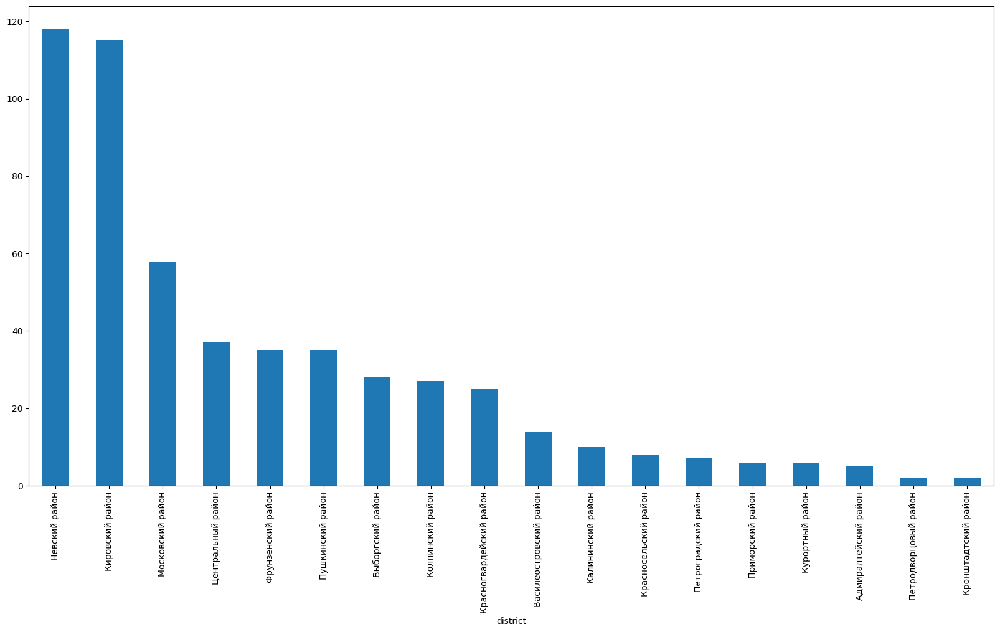

In [54]:
important_cases_by_building.groupby(['district'])['building_id'].nunique().sort_values(ascending=False).plot(kind='bar', figsize=(20,10))

<AxesSubplot: xlabel='construction_year'>

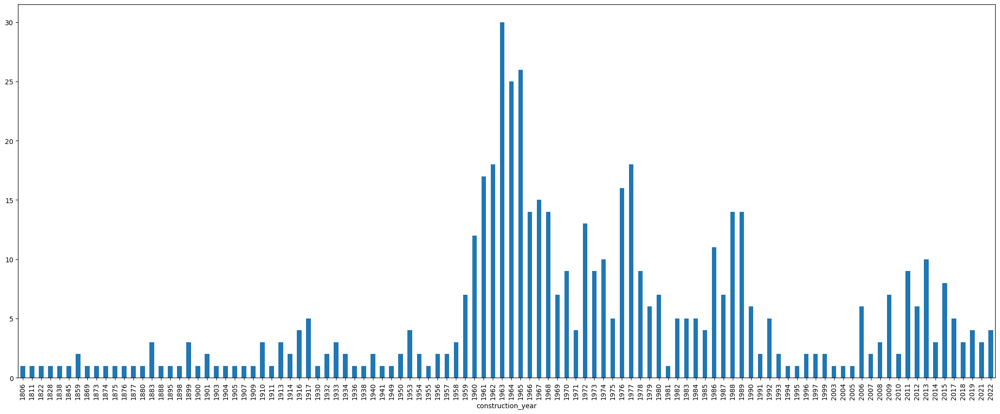

In [71]:
important_cases_by_building.groupby(['construction_year'])['building_id'].nunique().plot(kind='bar', figsize=(26,10))

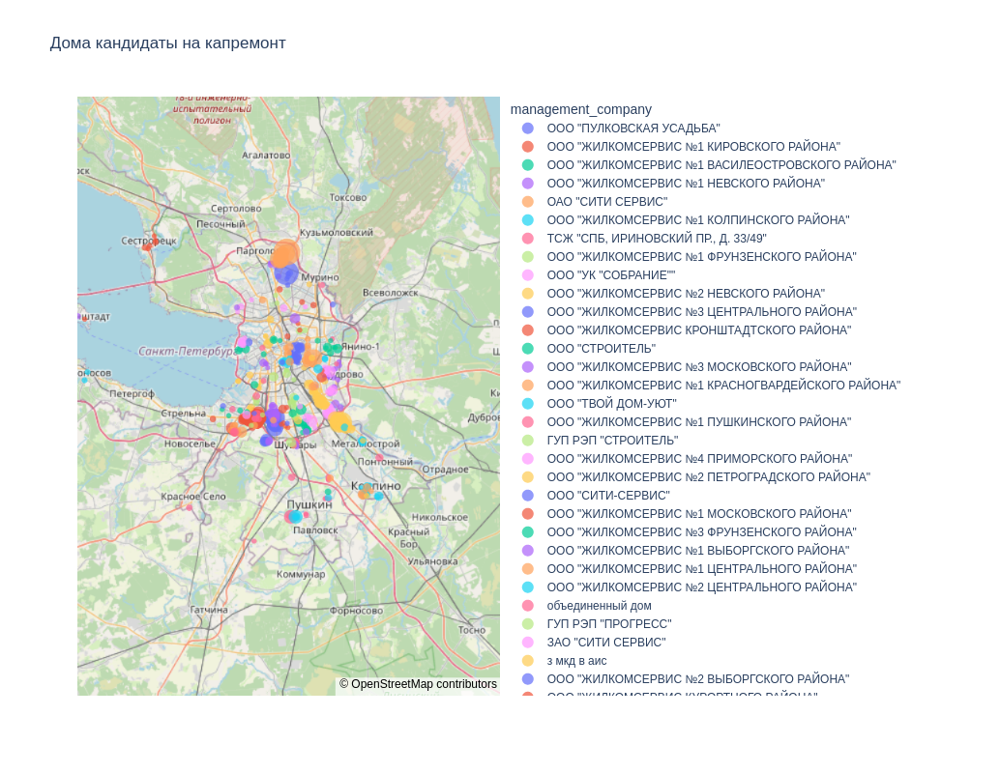

In [ ]:
# Пример визуализации объектов на карте
fig = px.scatter_mapbox(important_cases_by_building,
                        lat="latitude",
                        lon="longitude",
                        color="management_company",
                        size="problems_count_opened",
                        hover_data=["address", "problems_count_opened"],
                        zoom=8,
                        mapbox_style='open-street-map',
                        title="Дома кандидаты на капремонт",
                        width=1400, height=800)
fig.show()

In [203]:
#Пример визуализации объектов на карте
fig = px.scatter_mapbox(test,
                        lat="latitude",
                        lon="longitude",
                        #color="management_company",
                        size="problems_count_opened",
                        hover_data=["address", "problems_count_opened", 'pie'],
                        zoom=8,
                        mapbox_style='open-street-map',
                        title="Дома кандидаты на капремонт",
                        width=1400, height=800)
fig.update_traces(cluster=dict(enabled=True))
fig.show()


In [262]:
target_reasons

{'ХВС': ['Отсутствие холодной воды',
  'Плохое качество холодной воды',
  'Слабый напор холодной воды',
  'Дефект трубопровода, запорной арматуры в доме (искл.)',
  'Ненадлежащее содержание трубопроводов и элементов системы водоснабжения',
  'Протечка труб в подвале, на чердаке, на лестничной площадке',
  'Ненадлежащее содержание трубопроводов и элементов системы водоснабжения, являющихся общедомовым имуществом'],
 'ЛИФТ': ['Неисправный лифт'],
 'КР': ['Повреждение/засор внутреннего ливнестока',
  'Повреждение водосточной трубы',
  'Повреждение кровли',
  'Протечка кровли (искл.)'],
 'ФАС': ['Неудовлетворительное состояние архитектурных элементов фасада (архитектурные изыски)',
  'Неудовлетворительное состояние окраски фасада дома (искл.)',
  'Надписи на фасаде здания экстремистского характера (искл.)',
  'Неудовлетворительное состояние окраски фасада дома (кроме несанкционированных надписей / объявлений на стенах дома)',
  'Герметизация стыков стеновых панелей',
  'Повреждение участко